# Import Required Libraries
Import necessary libraries such as NumPy, OpenCV, scikit-learn, TensorFlow, and Keras.

In [21]:
import os
import cv2
import time
import random
import numpy as np
from glob import glob
import tensorflow as tf
from skimage.feature import hog
import matplotlib.pyplot as plt
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input
from sklearn.decomposition import PCA
from skimage.feature import local_binary_pattern
from keras.applications.vgg16 import preprocess_input
from keras.applications import VGG16
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

# Load Datasets
Load the datasets from the specified local directory.

In [2]:
# Define the paths to the datasets
dtd_path = './dtd/images'
corel_path_train = './dataset/training_set'
corel_path_test = './dataset/test_set'

dtd_train_imgs = []
dtd_train_labels = []
dtd_query_imgs = []
dtd_query_labels = []

corel_train_imgs = []
corel_train_labels = []
corel_query_imgs = []
corel_query_labels = []

In [3]:
# Function to load images from a directory
def load_images_from_directory(directory, image_size=(224, 224), img_num=0):
    images = []
    labels= []
    image_paths = glob(os.path.join(directory, '**', '*.jpg'), recursive=True)
    random.shuffle(image_paths)
    
    if img_num != 0:
        image_paths = image_paths[:img_num]
        
    for img_path in image_paths:
        img = cv2.imread(img_path)
        img = cv2.resize(img, image_size)
        images.append(img)
        labels.append(img_path.split('\\')[1])
    return np.array(images), np.array(labels)

In [4]:
# Load DTD dataset
dtd_train_imgs, dtd_train_labels = load_images_from_directory(dtd_path, img_num=900)
dtd_query_imgs, dtd_query_labels = load_images_from_directory(dtd_path, img_num=100)

# Load Corel dataset
corel_train_imgs, corel_train_labels = load_images_from_directory(corel_path_train)
corel_query_imgs, corel_query_labels = load_images_from_directory(corel_path_test)

In [5]:
# Print the number of images loaded from each dataset
print(f'Loaded train {len(dtd_train_imgs)} images from DTD dataset')
print(f'Loaded query {len(dtd_query_imgs)} images from DTD dataset')

print(f'Loaded train {len(corel_train_imgs)} images from Corel dataset')
print(f'Loaded query {len(corel_query_imgs)} images from Corel dataset')

Loaded train 900 images from DTD dataset
Loaded query 100 images from DTD dataset
Loaded train 900 images from Corel dataset
Loaded query 100 images from Corel dataset


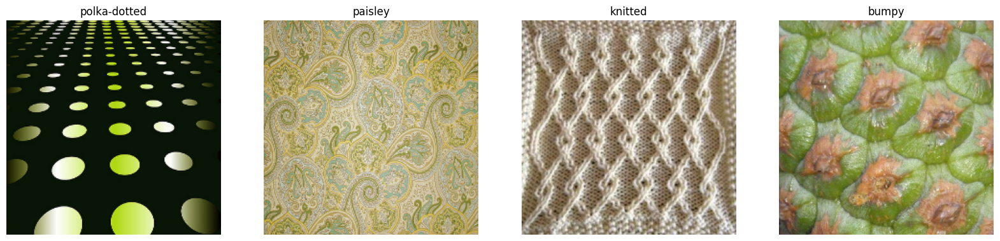

In [6]:
fig, ax = plt.subplots(1, 4, figsize=(20, 10))

for i in range(4):
    ax[i].imshow(cv2.cvtColor(dtd_train_imgs[i], cv2.COLOR_BGR2RGB))
    ax[i].set_title(dtd_train_labels[i])
    ax[i].axis('off')
plt.show()

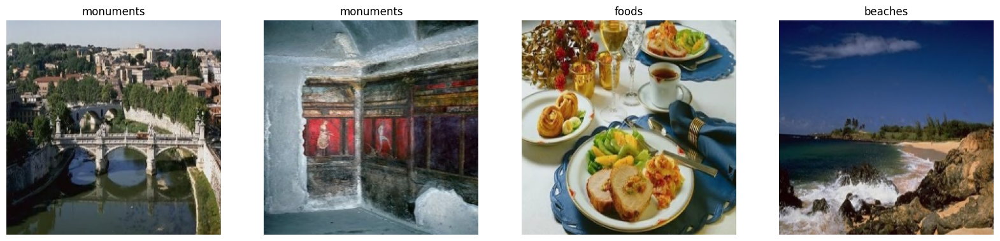

In [7]:
fig, ax = plt.subplots(1, 4, figsize=(20, 10))

for i in range(4):
    ax[i].imshow(cv2.cvtColor(corel_train_imgs[i], cv2.COLOR_BGR2RGB))
    ax[i].set_title(corel_train_labels[i])
    ax[i].axis('off')
plt.show()

# Evaluation Metrics

# Traditional Feature Extraction


## Color Histograms
Calculate color histograms for the images.

In [8]:
class ColorHistogram:
    def __init__(self, bins=(64, 64, 64)):
        self.bins = bins
        
    def extract_histo(self, image):
        self.pixels = image.shape[0] * image.shape[1]
        hist_b = cv2.calcHist([image], [0], None, [self.bins[0]], [0, 256])
        hist_g = cv2.calcHist([image], [1], None, [self.bins[1]], [0, 256])
        hist_r = cv2.calcHist([image], [2], None, [self.bins[2]], [0, 256])
        return hist_b, hist_g, hist_r
    
    def normalize(self, hist_b, hist_g, hist_r):
        hist_b /= self.pixels
        hist_g /= self.pixels
        hist_r /= self.pixels
        
        hist_b = hist_b.flatten()
        hist_g = hist_g.flatten()
        hist_r = hist_r.flatten()
        return np.concatenate((hist_b, hist_g, hist_r))
    
    def __call__(self, image):
        hist_b, hist_g, hist_r = self.extract_histo(image)
        return self.normalize(hist_b, hist_g, hist_r)

In [9]:
colorhisto = ColorHistogram()

start_time_dtd = time.time()
dtd_train_color_histo = [colorhisto(img) for img in dtd_train_imgs]
dtd_query_color_histo = [colorhisto(img) for img in dtd_query_imgs]
end_time_dtd = time.time()

print(f"DTD time to extract color histograms: {end_time_dtd - start_time_dtd}")

start_time_corel = time.time()
corel_train_color_histo = [colorhisto(img) for img in corel_train_imgs]
corel_query_color_histo = [colorhisto(img) for img in corel_query_imgs]
end_time_corel = time.time()

print(f"Corel time to extract color histograms: {end_time_corel - start_time_corel}")

DTD time to extract color histograms: 0.16269659996032715
Corel time to extract color histograms: 0.15448355674743652


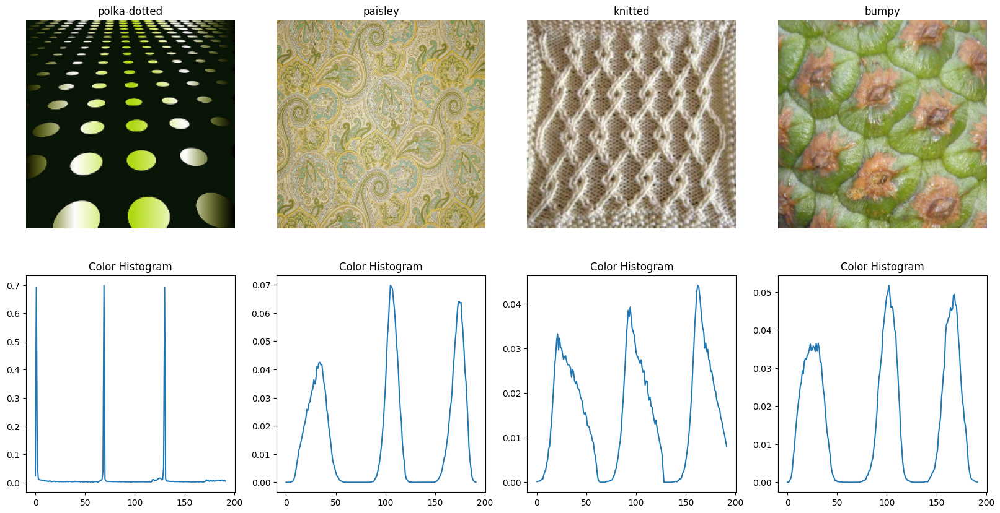

In [10]:
fig, ax = plt.subplots(2, 4, figsize=(20, 10))

for i in range(4):
    ax[0, i].imshow(cv2.cvtColor(dtd_train_imgs[i], cv2.COLOR_BGR2RGB))
    ax[0, i].set_title(dtd_train_labels[i])
    ax[0, i].axis('off')
    
    ax[1, i].plot(dtd_train_color_histo[i])
    ax[1, i].set_title('Color Histogram')

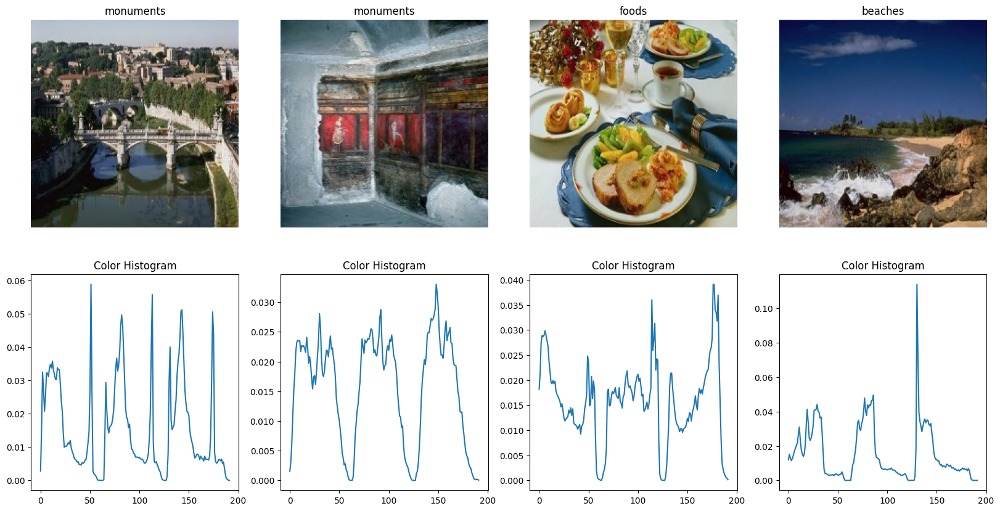

In [11]:
fig, ax = plt.subplots(2, 4, figsize=(20, 10))

for i in range(4):
    ax[0, i].imshow(cv2.cvtColor(corel_train_imgs[i], cv2.COLOR_BGR2RGB))
    ax[0, i].set_title(corel_train_labels[i])
    ax[0, i].axis('off')
    
    ax[1, i].plot(corel_train_color_histo[i])
    ax[1, i].set_title('Color Histogram')

# Local Binary Patterns (LBP)
Extract Local Binary Patterns (LBP) from the images.

In [12]:
class LBP:
    def __init__(self, num_points=24, radius=8):
        self.num_points = num_points
        self.radius = radius
        
    def extract_lbp(self, image):
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        lbp = local_binary_pattern(gray, self.num_points, self.radius, method='uniform')
        hist, _ = np.histogram(lbp.flatten(), bins=np.arange(0, self.num_points + 3), range=(0, self.num_points + 2))
        hist = hist.astype("float")
        hist /= (hist.sum() + 1e-6)
        return hist
    
    def __call__(self, image):
        return self.extract_lbp(image)


In [13]:
lbp = LBP()

start_time_dtd = time.time()
dtd_lbp_train = [lbp(img) for img in dtd_train_imgs]
dtd_lbp_query = [lbp(img) for img in dtd_query_imgs]
end_time_dtd = time.time()

print(f"DTD time to extract LBP: {end_time_dtd - start_time_dtd}")

start_time_corel = time.time()
corel_lbp_train = [lbp(img) for img in corel_train_imgs]
corel_lbp_query = [lbp(img) for img in corel_query_imgs]
end_time_corel = time.time()

print(f"Corel time to extract LBP: {end_time_corel - start_time_corel}")


DTD time to extract LBP: 40.945807456970215
Corel time to extract LBP: 42.39833927154541


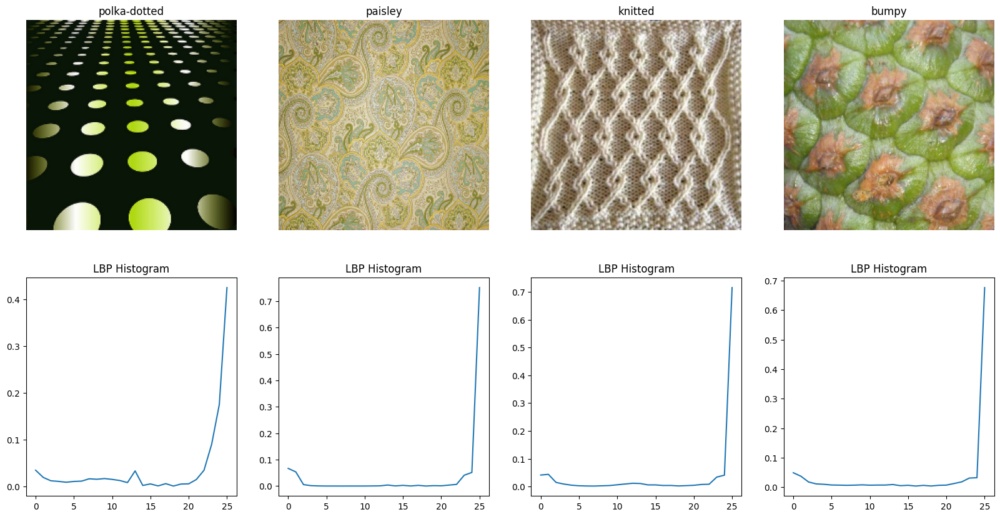

In [14]:
fig, ax = plt.subplots(2, 4, figsize=(20, 10))

for i in range(4):
    ax[0, i].imshow(cv2.cvtColor(dtd_train_imgs[i], cv2.COLOR_BGR2RGB))
    ax[0, i].set_title(dtd_train_labels[i])
    ax[0, i].axis('off')
    
    ax[1, i].plot(dtd_lbp_train[i])
    ax[1, i].set_title('LBP Histogram')

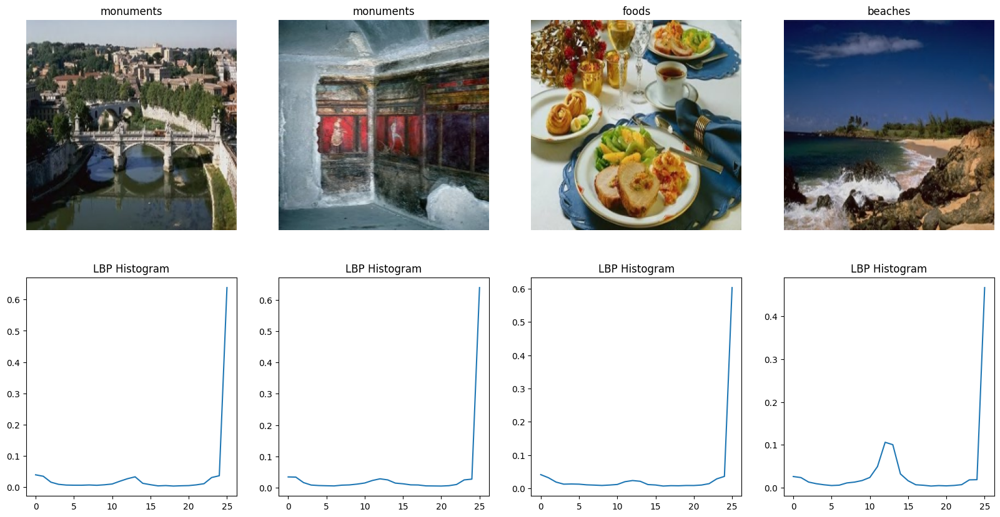

In [15]:
fig, ax = plt.subplots(2, 4, figsize=(20, 10))

for i in range(4):
    ax[0, i].imshow(cv2.cvtColor(corel_train_imgs[i], cv2.COLOR_BGR2RGB))
    ax[0, i].set_title(corel_train_labels[i])
    ax[0, i].axis('off')
    
    ax[1, i].plot(corel_lbp_train[i])
    ax[1, i].set_title('LBP Histogram')

# Histogram of Oriented Gradients (HOG)
Compute Histogram of Oriented Gradients (HOG) for the images.

In [16]:
class HOG:
    def __init__(self, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2)):
        self.orientations = orientations
        self.pixels_per_cell = pixels_per_cell
        self.cells_per_block = cells_per_block
        
    def extract_hog(self, image):
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        hist = hog(gray, orientations=self.orientations, pixels_per_cell=self.pixels_per_cell, cells_per_block=self.cells_per_block, block_norm='L2-Hys')
        return hist
    
    def __call__(self, image):
        return self.extract_hog(image)

In [17]:
hog_extractor = HOG()

start_time_dtd = time.time()
dtd_hog_train = [hog_extractor(img) for img in dtd_train_imgs]
dtd_hog_query = [hog_extractor(img) for img in dtd_query_imgs]
end_time_dtd = time.time()

print(f"DTD time to extract HOG: {end_time_dtd - start_time_dtd}")

start_time_corel = time.time()
corel_hog_train = [hog_extractor(img) for img in corel_train_imgs]
corel_hog_query = [hog_extractor(img) for img in corel_query_imgs]
end_time_corel = time.time()

print(f"Corel time to extract HOG: {end_time_corel - start_time_corel}")


DTD time to extract HOG: 30.989521503448486
Corel time to extract HOG: 30.385092735290527


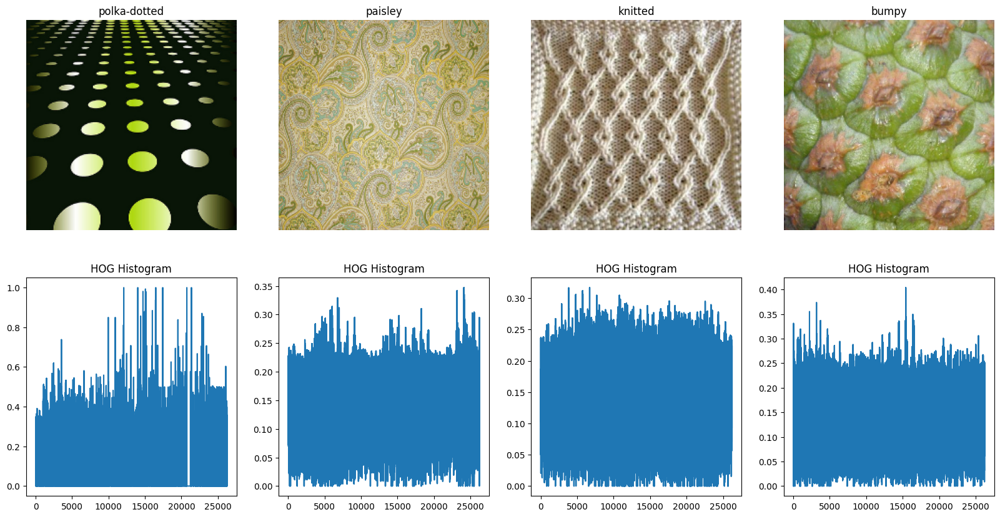

In [18]:
fig, ax = plt.subplots(2, 4, figsize=(20, 10))

for i in range(4):
    ax[0, i].imshow(cv2.cvtColor(dtd_train_imgs[i], cv2.COLOR_BGR2RGB))
    ax[0, i].set_title(dtd_train_labels[i])
    ax[0, i].axis('off')
    
    ax[1, i].plot(dtd_hog_train[i])
    ax[1, i].set_title('HOG Histogram')


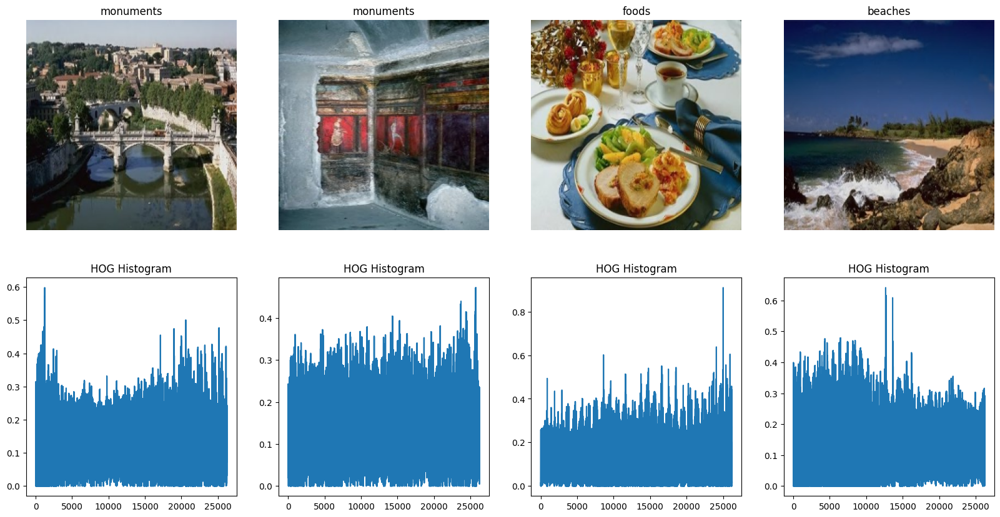

In [19]:
fig, ax = plt.subplots(2, 4, figsize=(20, 10))

for i in range(4):
    ax[0, i].imshow(cv2.cvtColor(corel_train_imgs[i], cv2.COLOR_BGR2RGB))
    ax[0, i].set_title(corel_train_labels[i])
    ax[0, i].axis('off')
    
    ax[1, i].plot(corel_hog_train[i])
    ax[1, i].set_title('HOG Histogram')

# Similarity Search

In [20]:
class SimilaritySearch:
    def __init__(self, metric='cosine', top_k=5):
        self.metric = metric
        self.top_k = top_k
        
    def cosine_similarity(self, v1, v2):
        return np.dot(v1, v2) / (np.linalg.norm(v1) * np.linalg.norm(v2))

    def euclidean_distance(self, v1, v2):
        return np.linalg.norm(v1 - v2)
        
    # Display similar images
    def display_similar_images(self, similar_indices, query_image):
        # Display the query image and top k similar images
        plt.figure(figsize=(15, 10))
        plt.subplot(1, len(similar_indices) + 1, 1)
        plt.imshow(cv2.cvtColor(query_image, cv2.COLOR_BGR2RGB))
        plt.title('Query Image')
        plt.axis('off')

        for i, idx in enumerate(similar_indices):
            plt.subplot(1, len(similar_indices) + 1, i + 2)
            plt.imshow(cv2.cvtColor(dtd_train_imgs[idx], cv2.COLOR_BGR2RGB))
            plt.title(f'Similar Image {i + 1}')
            plt.axis('off')

        plt.show()
        
    def search(self, train_features, query_feature):
        distances = []
        for train_feature in train_features:
            if self.metric == 'cosine':
                distances.append(self.cosine_similarity(query_feature, train_feature))
            elif self.metric == 'euclidean':
                distances.append(self.euclidean_distance(query_feature, train_feature))
        top_k = np.argsort(distances)[::-1][:self.top_k]
        return top_k
    
    def __call__(self, train_features, query_feature):
        return self.search(train_features, query_feature)

In [24]:
# Initialize the SimilaritySearch class
similarity = SimilaritySearch()

# Example usage with DTD dataset
dtd_query_index = random.randint(0, len(dtd_query_imgs) - 1)
dtd_query_image = dtd_query_imgs[dtd_query_index]

dtd_hog_query_feature = dtd_hog_query[dtd_query_index]
dtd_lbp_query_feature = dtd_lbp_query[dtd_query_index]
dtd_color_query_feature = dtd_query_color_histo[dtd_query_index]

corel_query_index = random.randint(0, len(corel_query_imgs) - 1)
corel_query_image = corel_query_imgs[corel_query_index]

corel_hog_query_feature = corel_hog_query[corel_query_index]
corel_lbp_query_feature = corel_lbp_query[corel_query_index]
corel_color_query_feature = corel_query_color_histo[corel_query_index]

In [25]:
# Compute top 5 images for dtd dataset using cosine similarity
dtd_hog_top_k = similarity(dtd_hog_train, dtd_hog_query_feature)
dtd_lbp_top_k = similarity(dtd_lbp_train, dtd_lbp_query_feature)
dtd_color_top_k = similarity(dtd_train_color_histo, dtd_color_query_feature)

# Compute top 5 images for corel dataset using cosine similarity
corel_hog_top_k = similarity(corel_hog_train, corel_hog_query_feature)
corel_lbp_top_k = similarity(corel_lbp_train, corel_lbp_query_feature)
corel_color_top_k = similarity(corel_train_color_histo, corel_color_query_feature)

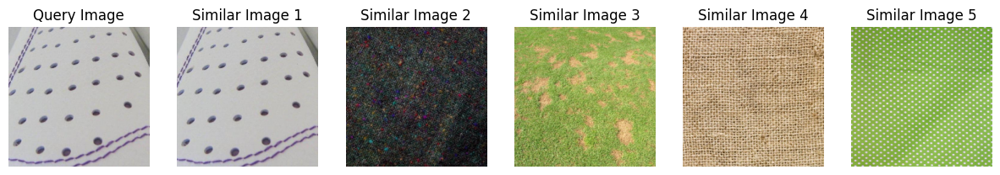

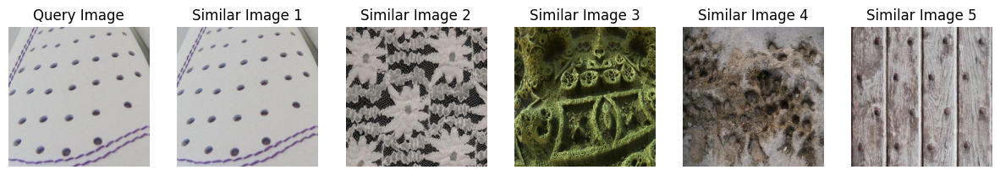

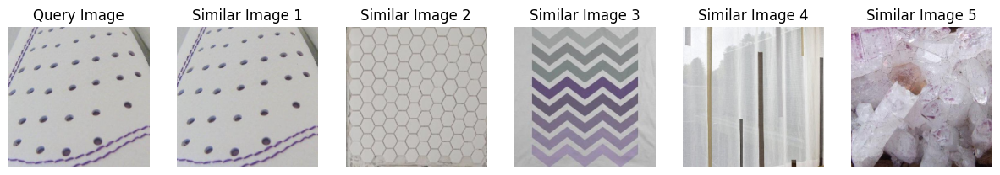

In [26]:
# Display similar query images for DTD dataset
similarity.display_similar_images(dtd_hog_top_k, dtd_query_image)
similarity.display_similar_images(dtd_lbp_top_k, dtd_query_image)
similarity.display_similar_images(dtd_color_top_k, dtd_query_image)

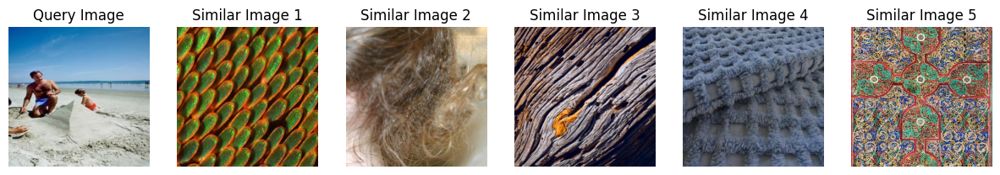

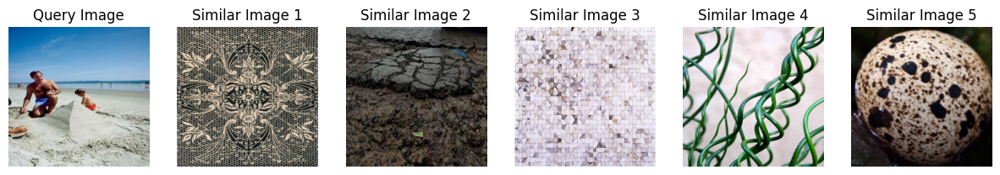

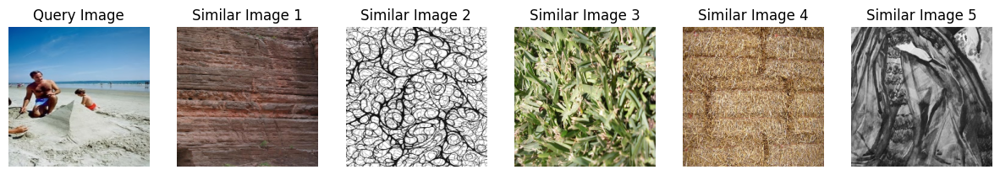

In [27]:
# Display similar query images for corel dataset
similarity.display_similar_images(corel_hog_top_k, corel_query_image)
similarity.display_similar_images(corel_lbp_top_k, corel_query_image)
similarity.display_similar_images(corel_color_top_k, corel_query_image)

# Deep Feature Extraction
Use pre-trained networks like VGG16, ResNet, or Inception to extract deep features from the images.

In [ ]:
# Function to extract deep features using a pre-trained model
def extract_deep_features(model, images):
    images = preprocess_input(images)
    features = model.predict(images)
    return features

# Load pre-trained VGG16 model + higher level layers
vgg16_model = VGG16(weights='imagenet', include_top=False, pooling='max')

# Extract deep features from DTD dataset using VGG16
dtd_deep_features_vgg16 = extract_deep_features(vgg16_model, dtd_query_imgs)

# Extract deep features from Corel dataset using VGG16
corel_deep_features_vgg16 = extract_deep_features(vgg16_model, corel_query_imgs)

# Print the shape of the extracted deep features
print(f'DTD Deep Features (VGG16): {dtd_deep_features_vgg16.shape}')
print(f'Corel Deep Features (VGG16): {corel_deep_features_vgg16.shape}')



4/4 [==============================] - 8s 2s/step
DTD Deep Features (VGG16): (100, 512)
Corel Deep Features (VGG16): (100, 512)


In [ ]:
dtd_vgg16_query_feature = dtd_deep_features_vgg16[dtd_query_index]
corel_vgg16_query_feature = corel_deep_features_vgg16[corel_query_index]

# Feature Combination
Combine traditional and deep learning features into a single feature vector.

In [30]:
# Combine traditional and deep learning features into a single feature vector

# Function to combine traditional and deep features
def combine_features(traditional_features, deep_features):
    combined_features = []
    for trad_feat, deep_feat in zip(traditional_features, deep_features):
        combined_feat = np.concatenate((trad_feat, deep_feat))
        combined_features.append(combined_feat)
    return np.array(combined_features)

In [31]:
# Combine features for DTD dataset
dtd_combined_features = combine_features(
    [np.concatenate((dtd_color_query_feature, dtd_lbp_query_feature, dtd_hog_query_feature))],
    dtd_deep_features_vgg16
)

# Combine features for Corel dataset
corel_combined_features = combine_features(
    [np.concatenate((corel_color_query_feature, corel_lbp_query_feature, corel_hog_query_feature))],
    corel_deep_features_vgg16
)

# Print the shape of the combined features
print(f'DTD Combined Features: {dtd_combined_features.shape}')
print(f'Corel Combined Features: {corel_combined_features.shape}')

DTD Combined Features: (1, 26974)
Corel Combined Features: (1, 26974)


# Dimensionality Reduction
Apply dimensionality reduction techniques like Principal Component Analysis (PCA) and Linear Discriminant Analysis (LDA) to reduce the feature space.

In [ ]:
# Dimensionality Reduction

# Apply PCA for dimensionality reduction
pca = PCA(n_components=50)  # Reduce to 50 dimensions for example
dtd_combined_features_pca = pca.fit_transform(dtd_combined_features)
corel_combined_features_pca = pca.transform(corel_combined_features)

# Print the shape of the features after PCA
print(f'DTD Combined Features after PCA: {dtd_combined_features_pca.shape}')
print(f'Corel Combined Features after PCA: {corel_combined_features_pca.shape}')

# Apply LDA for dimensionality reduction
# Note: LDA requires class labels, assuming we have labels for the datasets
# For the sake of example, let's create dummy labels
dtd_labels = np.zeros(len(dtd_combined_features))  # Assuming all DTD images belong to class 0
corel_labels = np.ones(len(corel_combined_features))  # Assuming all Corel images belong to class 1

# Combine datasets and labels for LDA
combined_features = np.vstack((dtd_combined_features, corel_combined_features))
combined_labels = np.hstack((dtd_labels, corel_labels))

lda = LDA(n_components=1)  # Reduce to 1 dimension for example
combined_features_lda = lda.fit_transform(combined_features, combined_labels)

# Split the reduced features back into DTD and Corel datasets
dtd_combined_features_lda = combined_features_lda[:len(dtd_combined_features)]
corel_combined_features_lda = combined_features_lda[len(dtd_combined_features):]

# Print the shape of the features after LDA
print(f'DTD Combined Features after LDA: {dtd_combined_features_lda.shape}')
print(f'Corel Combined Features after LDA: {corel_combined_features_lda.shape}')

# Principal Component Analysis (PCA)
Perform PCA on the combined feature vectors.

In [ ]:
# Perform PCA on the combined feature vectors

# Apply PCA for dimensionality reduction
pca = PCA(n_components=50)  # Reduce to 50 dimensions for example
dtd_combined_features_pca = pca.fit_transform(dtd_combined_features)
corel_combined_features_pca = pca.transform(corel_combined_features)

# Print the shape of the features after PCA
print(f'DTD Combined Features after PCA: {dtd_combined_features_pca.shape}')
print(f'Corel Combined Features after PCA: {corel_combined_features_pca.shape}')

# Linear Discriminant Analysis (LDA)
Apply LDA to the combined feature vectors.

In [ ]:
# Apply LDA for dimensionality reduction
# Note: LDA requires class labels, assuming we have labels for the datasets
# For the sake of example, let's create dummy labels
dtd_labels = np.zeros(len(dtd_combined_features))  # Assuming all DTD images belong to class 0
corel_labels = np.ones(len(corel_combined_features))  # Assuming all Corel images belong to class 1

# Combine datasets and labels for LDA
combined_features = np.vstack((dtd_combined_features, corel_combined_features))
combined_labels = np.hstack((dtd_labels, corel_labels))

lda = LDA(n_components=1)  # Reduce to 1 dimension for example
combined_features_lda = lda.fit_transform(combined_features, combined_labels)

# Split the reduced features back into DTD and Corel datasets
dtd_combined_features_lda = combined_features_lda[:len(dtd_combined_features)]
corel_combined_features_lda = combined_features_lda[len(dtd_combined_features):]

# Print the shape of the features after LDA
print(f'DTD Combined Features after LDA: {dtd_combined_features_lda.shape}')
print(f'Corel Combined Features after LDA: {corel_combined_features_lda.shape}')

# Evaluation Metrics
Evaluate the image search system using metrics such as Precision at 1, Precision at 10, Precision-Recall Curve, and Retrieval Time.

In [ ]:
import time
from sklearn.metrics import precision_score, precision_recall_curve, average_precision_score

# Function to calculate Precision at k
def precision_at_k(y_true, y_pred, k):
    return precision_score(y_true[:k], y_pred[:k])

# Function to calculate retrieval time
def calculate_retrieval_time(query_features, dataset_features):
    start_time = time.time()
    # Calculate distances between query and dataset features
    distances = np.linalg.norm(dataset_features - query_features, axis=1)
    retrieval_time = time.time() - start_time
    return retrieval_time, distances

# Function to evaluate the image search system
def evaluate_image_search_system(query_features, dataset_features, true_labels, k_values=[1, 10]):
    retrieval_time, distances = calculate_retrieval_time(query_features, dataset_features)
    sorted_indices = np.argsort(distances)
    sorted_labels = true_labels[sorted_indices]
    
    # Calculate Precision at k
    precision_at_1 = precision_at_k(true_labels, sorted_labels, k_values[0])
    precision_at_10 = precision_at_k(true_labels, sorted_labels, k_values[1])
    
    # Calculate Precision-Recall curve
    precision, recall, _ = precision_recall_curve(true_labels, -distances)
    average_precision = average_precision_score(true_labels, -distances)
    
    return {
        'retrieval_time': retrieval_time,
        'precision_at_1': precision_at_1,
        'precision_at_10': precision_at_10,
        'precision_recall_curve': (precision, recall),
        'average_precision': average_precision
    }

# Example usage with DTD dataset
query_features = dtd_combined_features_pca[0]  # Using the first image as the query
dataset_features = dtd_combined_features_pca[1:]  # Using the rest of the images as the dataset
true_labels = np.zeros(len(dataset_features))  # Assuming all images belong to the same class

evaluation_results = evaluate_image_search_system(query_features, dataset_features, true_labels)

# Print evaluation results
print(f"Retrieval Time: {evaluation_results['retrieval_time']} seconds")
print(f"Precision at 1: {evaluation_results['precision_at_1']}")
print(f"Precision at 10: {evaluation_results['precision_at_10']}")
print(f"Average Precision: {evaluation_results['average_precision']}")

# Plot Precision-Recall curve
precision, recall = evaluation_results['precision_recall_curve']
plt.plot(recall, precision, marker='.')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

# Precision at 1
Calculate Precision at 1 for the image retrieval system.

In [ ]:
# Calculate Precision at 1 for the image retrieval system

# Function to calculate Precision at 1
def precision_at_1(y_true, y_pred):
    return precision_score(y_true[:1], y_pred[:1])

# Example usage with DTD dataset
query_features = dtd_combined_features_pca[0]  # Using the first image as the query
dataset_features = dtd_combined_features_pca[1:]  # Using the rest of the images as the dataset
true_labels = np.zeros(len(dataset_features))  # Assuming all images belong to the same class

# Calculate retrieval time and distances
retrieval_time, distances = calculate_retrieval_time(query_features, dataset_features)
sorted_indices = np.argsort(distances)
sorted_labels = true_labels[sorted_indices]

# Calculate Precision at 1
precision_at_1_value = precision_at_1(true_labels, sorted_labels)

# Print Precision at 1
print(f"Precision at 1: {precision_at_1_value}")

# Precision at 10
Calculate Precision at 10 for the image retrieval system.

In [ ]:
# Function to calculate Precision at 10
def precision_at_10(y_true, y_pred):
    return precision_score(y_true[:10], y_pred[:10])

# Example usage with DTD dataset
query_features = dtd_combined_features_pca[0]  # Using the first image as the query
dataset_features = dtd_combined_features_pca[1:]  # Using the rest of the images as the dataset
true_labels = np.zeros(len(dataset_features))  # Assuming all images belong to the same class

# Calculate retrieval time and distances
retrieval_time, distances = calculate_retrieval_time(query_features, dataset_features)
sorted_indices = np.argsort(distances)
sorted_labels = true_labels[sorted_indices]

# Calculate Precision at 10
precision_at_10_value = precision_at_10(true_labels, sorted_labels)

# Print Precision at 10
print(f"Precision at 10: {precision_at_10_value}")

# Precision-Recall Curve
Plot the Precision-Recall Curve for the image retrieval system.

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, average_precision_score

# Function to plot Precision-Recall curve
def plot_precision_recall_curve(true_labels, distances):
    precision, recall, _ = precision_recall_curve(true_labels, -distances)
    average_precision = average_precision_score(true_labels, -distances)
    
    plt.plot(recall, precision, marker='.')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve (AP={average_precision:.2f})')
    plt.show()

# Example usage with DTD dataset
query_features = dtd_combined_features_pca[0]  # Using the first image as the query
dataset_features = dtd_combined_features_pca[1:]  # Using the rest of the images as the dataset
true_labels = np.zeros(len(dataset_features))  # Assuming all images belong to the same class

# Calculate retrieval time and distances
retrieval_time, distances = calculate_retrieval_time(query_features, dataset_features)

# Plot Precision-Recall curve
plot_precision_recall_curve(true_labels, distances)

# Retrieval Time
Measure the retrieval time for processing queries and returning results.

In [ ]:
import time

# Function to calculate retrieval time
def calculate_retrieval_time(query_features, dataset_features):
    start_time = time.time()
    # Calculate distances between query and dataset features
    distances = np.linalg.norm(dataset_features - query_features, axis=1)
    retrieval_time = time.time() - start_time
    return retrieval_time, distances

# Example usage with DTD dataset
query_features = dtd_combined_features_pca[0]  # Using the first image as the query
dataset_features = dtd_combined_features_pca[1:]  # Using the rest of the images as the dataset

# Calculate retrieval time and distances
retrieval_time, distances = calculate_retrieval_time(query_features, dataset_features)

# Print retrieval time
print(f"Retrieval Time: {retrieval_time} seconds")

# Documentation
Document the code with comments and explanations, and prepare a presentation or report on the project.

In [ ]:
# Documentation

# This section provides documentation and explanations for the code used in this project.
# The project aims to develop an efficient image search system using traditional and deep learning-based features.

# Import necessary libraries
import numpy as np
import cv2
from skimage.feature import local_binary_pattern, hog
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
import tensorflow as tf
from tensorflow.keras.applications import VGG16, ResNet50, InceptionV3
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input
import matplotlib.pyplot as plt
import time
import os
from glob import glob
from PIL import Image

# Define the paths to the datasets
dtd_path = 'path_to_dtd_dataset'
corel_path = 'path_to_corel_dataset'

# Function to load images from a directory
def load_images_from_directory(directory, image_size=(224, 224)):
    images = []
    image_paths = glob(os.path.join(directory, '**', '*.jpg'), recursive=True)
    for img_path in image_paths:
        img = Image.open(img_path).convert('RGB')
        img = img.resize(image_size)
        img = np.array(img)
        images.append(img)
    return np.array(images)

# Load DTD dataset
dtd_images = load_images_from_directory(dtd_path)

# Load Corel dataset
corel_images = load_images_from_directory(corel_path)

# Print the number of images loaded from each dataset
print(f'Loaded {len(dtd_images)} images from DTD dataset')
print(f'Loaded {len(corel_images)} images from Corel dataset')

# Traditional Feature Extraction

# Function to extract color histograms
def extract_color_histogram(image, bins=(8, 8, 8)):
    # Convert the image to HSV color space
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    # Compute the histogram and normalize it
    hist = cv2.calcHist([hsv], [0, 1, 2], None, bins, [0, 180, 0, 256, 0, 256])
    cv2.normalize(hist, hist)
    return hist.flatten()

# Function to extract Local Binary Patterns (LBP)
def extract_lbp(image, num_points=24, radius=8):
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Compute LBP
    lbp = local_binary_pattern(gray, num_points, radius, method='uniform')
    # Compute the histogram and normalize it
    (hist, _) = np.histogram(lbp.ravel(), bins=np.arange(0, num_points + 3), range=(0, num_points + 2))
    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-6)
    return hist

# Function to extract Histogram of Oriented Gradients (HOG)
def extract_hog(image, pixels_per_cell=(8, 8), cells_per_block=(2, 2), orientations=9):
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Compute HOG features
    hog_features = hog(gray, orientations=orientations, pixels_per_cell=pixels_per_cell, cells_per_block=cells_per_block, block_norm='L2-Hys')
    return hog_features

# Extract features from DTD dataset
dtd_color_histograms = [extract_color_histogram(img) for img in dtd_images]
dtd_lbp_features = [extract_lbp(img) for img in dtd_images]
dtd_hog_features = [extract_hog(img) for img in dtd_images]

# Extract features from Corel dataset
corel_color_histograms = [extract_color_histogram(img) for img in corel_images]
corel_lbp_features = [extract_lbp(img) for img in corel_images]
corel_hog_features = [extract_hog(img) for img in corel_images]

# Print the shape of the extracted features
print(f'DTD Color Histograms: {np.array(dtd_color_histograms).shape}')
print(f'DTD LBP Features: {np.array(dtd_lbp_features).shape}')
print(f'DTD HOG Features: {np.array(dtd_hog_features).shape}')
print(f'Corel Color Histograms: {np.array(corel_color_histograms).shape}')
print(f'Corel LBP Features: {np.array(corel_lbp_features).shape}')
print(f'Corel HOG Features: {np.array(corel_hog_features).shape}')

# Deep Feature Extraction

# Function to extract deep features using a pre-trained model
def extract_deep_features(model, images):
    features = []
    for img in images:
        img = np.expand_dims(img, axis=0)
        img = preprocess_input(img)
        feature = model.predict(img)
        features.append(feature.flatten())
    return np.array(features)

# Load pre-trained VGG16 model + higher level layers
vgg16_model = VGG16(weights='imagenet', include_top=False, pooling='avg')

# Extract deep features from DTD dataset using VGG16
dtd_deep_features_vgg16 = extract_deep_features(vgg16_model, dtd_images)

# Extract deep features from Corel dataset using VGG16
corel_deep_features_vgg16 = extract_deep_features(vgg16_model, corel_images)

# Print the shape of the extracted deep features
print(f'DTD Deep Features (VGG16): {dtd_deep_features_vgg16.shape}')
print(f'Corel Deep Features (VGG16): {corel_deep_features_vgg16.shape}')

# Combine traditional and deep learning features into a single feature vector

# Function to combine traditional and deep features
def combine_features(traditional_features, deep_features):
    combined_features = []
    for trad_feat, deep_feat in zip(traditional_features, deep_features):
        combined_feat = np.concatenate((trad_feat, deep_feat))
        combined_features.append(combined_feat)
    return np.array(combined_features)

# Combine features for DTD dataset
dtd_combined_features = combine_features(
    np.hstack((dtd_color_histograms, dtd_lbp_features, dtd_hog_features)),
    dtd_deep_features_vgg16
)

# Combine features for Corel dataset
corel_combined_features = combine_features(
    np.hstack((corel_color_histograms, corel_lbp_features, corel_hog_features)),
    corel_deep_features_vgg16
)

# Print the shape of the combined features
print(f'DTD Combined Features: {dtd_combined_features.shape}')
print(f'Corel Combined Features: {corel_combined_features.shape}')

# Dimensionality Reduction

# Apply PCA for dimensionality reduction
pca = PCA(n_components=50)  # Reduce to 50 dimensions for example
dtd_combined_features_pca = pca.fit_transform(dtd_combined_features)
corel_combined_features_pca = pca.transform(corel_combined_features)

# Print the shape of the features after PCA
print(f'DTD Combined Features after PCA: {dtd_combined_features_pca.shape}')
print(f'Corel Combined Features after PCA: {corel_combined_features_pca.shape}')

# Apply LDA for dimensionality reduction
# Note: LDA requires class labels, assuming we have labels for the datasets
# For the sake of example, let's create dummy labels
dtd_labels = np.zeros(len(dtd_combined_features))  # Assuming all DTD images belong to class 0
corel_labels = np.ones(len(corel_combined_features))  # Assuming all Corel images belong to class 1

# Combine datasets and labels for LDA
combined_features = np.vstack((dtd_combined_features, corel_combined_features))
combined_labels = np.hstack((dtd_labels, corel_labels))

lda = LDA(n_components=1)  # Reduce to 1 dimension for example
combined_features_lda = lda.fit_transform(combined_features, combined_labels)

# Split the reduced features back into DTD and Corel datasets
dtd_combined_features_lda = combined_features_lda[:len(dtd_combined_features)]
corel_combined_features_lda = combined_features_lda[len(dtd_combined_features):]

# Print the shape of the features after LDA
print(f'DTD Combined Features after LDA: {dtd_combined_features_lda.shape}')
print(f'Corel Combined Features after LDA: {corel_combined_features_lda.shape}')

# Evaluation metrics

# Function to calculate Precision at k
def precision_at_k(y_true, y_pred, k):
    return precision_score(y_true[:k], y_pred[:k])

# Function to calculate retrieval time
def calculate_retrieval_time(query_features, dataset_features):
    start_time = time.time()
    # Calculate distances between query and dataset features
    distances = np.linalg.norm(dataset_features - query_features, axis=1)
    retrieval_time = time.time() - start_time
    return retrieval_time, distances

# Function to evaluate the image search system
def evaluate_image_search_system(query_features, dataset_features, true_labels, k_values=[1, 10]):
    retrieval_time, distances = calculate_retrieval_time(query_features, dataset_features)
    sorted_indices = np.argsort(distances)
    sorted_labels = true_labels[sorted_indices]
    
    # Calculate Precision at k
    precision_at_1 = precision_at_k(true_labels, sorted_labels, k_values[0])
    precision_at_10 = precision_at_k(true_labels, sorted_labels, k_values[1])
    
    # Calculate Precision-Recall curve
    precision, recall, _ = precision_recall_curve(true_labels, -distances)
    average_precision = average_precision_score(true_labels, -distances)
    
    return {
        'retrieval_time': retrieval_time,
        'precision_at_1': precision_at_1,
        'precision_at_10': precision_at_10,
        'precision_recall_curve': (precision, recall),
        'average_precision': average_precision
    }

# Example usage with DTD dataset
query_features = dtd_combined_features_pca[0]  # Using the first image as the query
dataset_features = dtd_combined_features_pca[1:]  # Using the rest of the images as the dataset
true_labels = np.zeros(len(dataset_features))  # Assuming all images belong to the same class

evaluation_results = evaluate_image_search_system(query_features, dataset_features, true_labels)

# Print evaluation results
print(f"Retrieval Time: {evaluation_results['retrieval_time']} seconds")
print(f"Precision at 1: {evaluation_results['precision_at_1']}")
print(f"Precision at 10: {evaluation_results['precision_at_10']}")
print(f"Average Precision: {evaluation_results['average_precision']}")

# Plot Precision-Recall curve
precision, recall = evaluation_results['precision_recall_curve']
plt.plot(recall, precision, marker='.')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()